✅ Dataset Loaded Successfully!
                                          image_path  label
0  C:\Users\imran\OneDrive\Robotics Projects\Imag...      0
1  C:\Users\imran\OneDrive\Robotics Projects\Imag...      0
2  C:\Users\imran\OneDrive\Robotics Projects\Imag...      0
3  C:\Users\imran\OneDrive\Robotics Projects\Imag...      0
4  C:\Users\imran\OneDrive\Robotics Projects\Imag...      0

Class Distribution:
 label
0    730
1    730
Name: count, dtype: int64

Total images: 1460


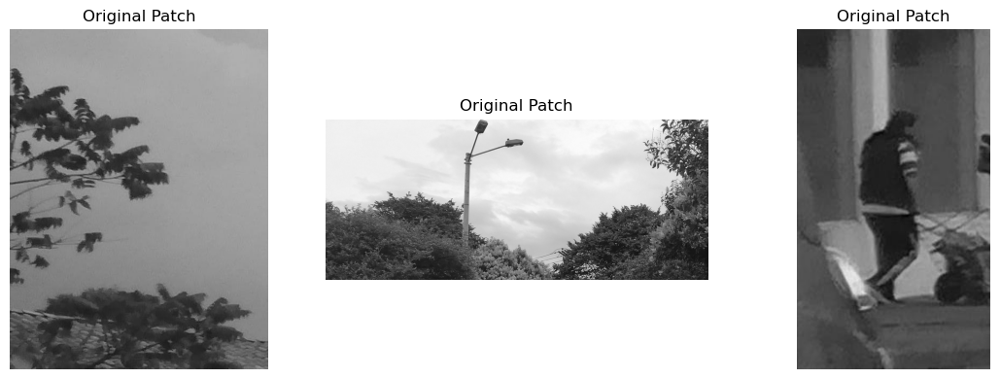

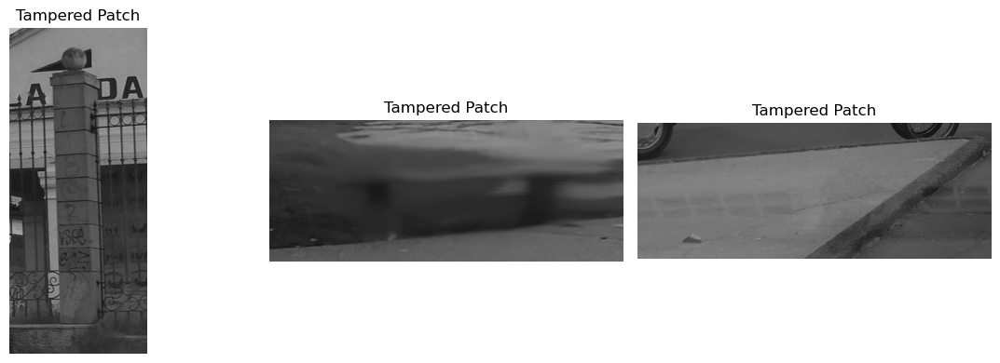

In [2]:
# -----------------------------
# Phase 1: Dataset Preparation
# -----------------------------

import os
import glob
import pandas as pd
import cv2
import matplotlib.pyplot as plt

# === Step 1: Define paths ===
original_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\TRAINING_CG-1050\TRAINING\ORIGINAL"
tampered_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\TRAINING_CG-1050\TRAINING\TAMPERED"

# === Step 2: Load image paths and assign labels ===
def load_image_paths(original_dir, tampered_dir):
    data = []

    # Load original images (label 0)
    original_images = glob.glob(os.path.join(original_dir, "*.jpg"))  # or change to *.png if needed
    for path in original_images:
        data.append((path, 0))

    # Load tampered images (label 1)
    tampered_images = glob.glob(os.path.join(tampered_dir, "*.jpg"))
    for path in tampered_images:
        data.append((path, 1))

    # Create dataframe
    df = pd.DataFrame(data, columns=['image_path', 'label'])
    return df

# Load the training dataset
train_df = load_image_paths(original_path, tampered_path)

# === Step 3: Preview the data ===
print("✅ Dataset Loaded Successfully!")
print(train_df.head())
print("\nClass Distribution:\n", train_df['label'].value_counts())
print(f"\nTotal images: {len(train_df)}")

# === Step 4: Visualize a few images ===
def show_sample_images(df, label_value, n=3):
    subset = df[df['label'] == label_value].sample(n, random_state=42)
    label_name = "Original" if label_value == 0 else "Tampered"

    plt.figure(figsize=(12, 4))
    for i, row in enumerate(subset.itertuples()):
        img = cv2.imread(row.image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(1, n, i+1)
        plt.imshow(img)
        plt.title(f"{label_name} Patch")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Show examples from each class
show_sample_images(train_df, label_value=0)  # Original patches
show_sample_images(train_df, label_value=1)  # Tampered patches


In [3]:
# -----------------------------------------------
# Phase 2: Data Preprocessing with Enhancements
# -----------------------------------------------

import os
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import random

# === CONFIGURATION ===
IMG_SIZE = 128
AUGMENT = True

# === FILE PATHS ===
original_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\TRAINING_CG-1050\TRAINING\ORIGINAL"
tampered_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\TRAINING_CG-1050\TRAINING\TAMPERED"

# === Load image paths and labels ===
def load_image_paths(original_dir, tampered_dir):
    data = []
    
    original_images = [os.path.join(original_dir, f) for f in os.listdir(original_dir) if f.endswith('.jpg')]
    tampered_images = [os.path.join(tampered_dir, f) for f in os.listdir(tampered_dir) if f.endswith('.jpg')]

    for path in original_images:
        data.append((path, 0))  # Label 0 = original

    for path in tampered_images:
        data.append((path, 1))  # Label 1 = tampered

    return pd.DataFrame(data, columns=["image_path", "label"])

# === Augmentation function ===
def augment_image(img):
    # Horizontal flip
    if random.random() > 0.5:
        img = cv2.flip(img, 1)
    
    # Brightness adjustment
    if random.random() > 0.5:
        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        hsv[:, :, 2] = hsv[:, :, 2] * (0.5 + np.random.rand() * 1.5)
        img = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

    # Small angle rotation
    if random.random() > 0.5:
        angle = np.random.uniform(-15, 15)
        M = cv2.getRotationMatrix2D((IMG_SIZE/2, IMG_SIZE/2), angle, 1)
        

    return img

# === Preprocessing function ===
def preprocess_images(df, img_size=128, augment=False):
    images = []
    labels = []

    for row in tqdm(df.itertuples(), total=len(df)):
        img = cv2.imread(row.image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (img_size, img_size))

        # Augment only tampered class (optional)
        if augment and row.label == 1:
            img = augment_image(img)

        img = img / 255.0  # Normalize
        images.append(img)
        labels.append(row.label)

    return np.array(images), np.array(labels)

# === Load dataset ===
train_df = load_image_paths(original_path, tampered_path)
print("✅ Image paths loaded:", train_df.shape)

# === Preprocess images with optional augmentation ===
X, y = preprocess_images(train_df, IMG_SIZE, augment=AUGMENT)
print("✅ Images preprocessed. Shape:", X.shape)

# === Split into training and validation sets ===
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=42
)

print(f"Training samples: {X_train.shape[0]}")
print(f"Validation samples: {X_val.shape[0]}")

# === Save arrays to .npy files ===
np.save("X_train.npy", X_train)
np.save("y_train.npy", y_train)
np.save("X_val.npy", X_val)
np.save("y_val.npy", y_val)

print("All data saved to .npy files for future use.")


✅ Image paths loaded: (1460, 2)


100%|██████████| 1460/1460 [00:06<00:00, 214.48it/s]


✅ Images preprocessed. Shape: (1460, 128, 128, 3)
Training samples: 1168
Validation samples: 292
All data saved to .npy files for future use.


Epoch 1 | Train Loss: 0.6930 | Val Loss: 0.6863
Epoch 2 | Train Loss: 0.6728 | Val Loss: 0.6606
Epoch 3 | Train Loss: 0.6401 | Val Loss: 0.6375
Epoch 4 | Train Loss: 0.6096 | Val Loss: 0.6025
Epoch 5 | Train Loss: 0.5749 | Val Loss: 0.5836
Epoch 6 | Train Loss: 0.5459 | Val Loss: 0.5918
Epoch 7 | Train Loss: 0.5341 | Val Loss: 0.5664
Epoch 8 | Train Loss: 0.5004 | Val Loss: 0.5684
Epoch 9 | Train Loss: 0.4956 | Val Loss: 0.5929
Epoch 10 | Train Loss: 0.4881 | Val Loss: 0.5600
Epoch 11 | Train Loss: 0.4596 | Val Loss: 0.5654
Epoch 12 | Train Loss: 0.4511 | Val Loss: 0.5639
Epoch 13 | Train Loss: 0.4520 | Val Loss: 0.5755
Epoch 14 | Train Loss: 0.4303 | Val Loss: 0.5617
Epoch 15 | Train Loss: 0.4173 | Val Loss: 0.5914
✅ Model saved as tampered_patch_cnn.pth


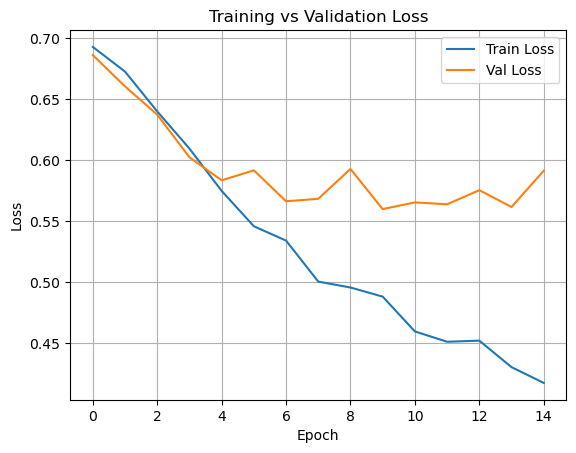

In [4]:
# -------------------------------------
# Phase 3: CNN Model Training in PyTorch
# -------------------------------------

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt

# === Step 1: Load Data ===
X_train = np.load("X_train.npy")
y_train = np.load("y_train.npy")
X_val   = np.load("X_val.npy")
y_val   = np.load("y_val.npy")

# === Step 2: Create Custom Dataset ===
class PatchDataset(Dataset):
    def __init__(self, X, y, transform=None):
        self.X = X
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        image = self.X[idx].astype(np.float32)
        label = self.y[idx]
        image = torch.tensor(image).permute(2, 0, 1)  # From HWC to CHW
        label = torch.tensor(label).float()
        return image, label

# === Step 3: DataLoaders ===
train_dataset = PatchDataset(X_train, y_train)
val_dataset = PatchDataset(X_val, y_val)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

# === Step 4: CNN Model ===
class TamperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),  # 64x64
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),  # 32x32
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),  # 16x16
            nn.Flatten(),
            nn.Linear(128 * 16 * 16, 128), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(128, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).squeeze()

model = TamperCNN()

# === Step 5: Training Setup ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

loss_fn = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# === Step 6: Training Loop ===
train_loss_hist, val_loss_hist = [], []

for epoch in range(15):
    model.train()
    total_loss = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        preds = model(X_batch)
        loss = loss_fn(preds, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    model.eval()
    val_loss = 0
    with torch.no_grad():
        for X_batch, y_batch in val_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            preds = model(X_batch)
            val_loss += loss_fn(preds, y_batch).item()

    train_loss_hist.append(total_loss / len(train_loader))
    val_loss_hist.append(val_loss / len(val_loader))

    print(f"Epoch {epoch+1} | Train Loss: {train_loss_hist[-1]:.4f} | Val Loss: {val_loss_hist[-1]:.4f}")

# === Step 7: Save Model ===
torch.save(model.state_dict(), "tampered_patch_cnn.pth")
print("✅ Model saved as tampered_patch_cnn.pth")

# === Step 8: Plot Loss ===
plt.plot(train_loss_hist, label='Train Loss')
plt.plot(val_loss_hist, label='Val Loss')
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()



🔍 Classification Report:
              precision    recall  f1-score   support

    Original       0.53      0.94      0.68       314
    Tampered       0.74      0.18      0.29       314

    accuracy                           0.56       628
   macro avg       0.63      0.56      0.48       628
weighted avg       0.63      0.56      0.48       628



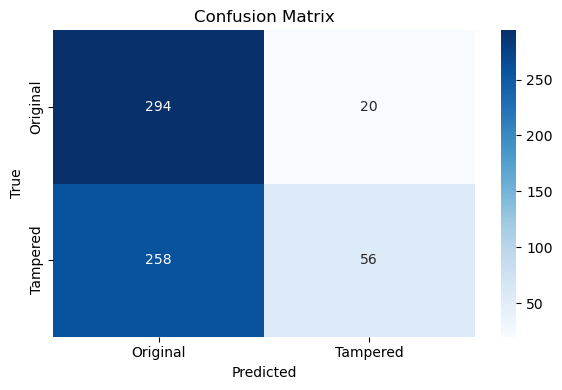

In [6]:
# ---------------------------------------------
# Phase 4: Evaluation on External Validation Set
# ---------------------------------------------

import os
import cv2
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# === Model Architecture (same as in training) ===
class TamperCNN(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.net = torch.nn.Sequential(
            torch.nn.Conv2d(3, 32, 3, padding=1), torch.nn.ReLU(), torch.nn.MaxPool2d(2),
            torch.nn.Conv2d(32, 64, 3, padding=1), torch.nn.ReLU(), torch.nn.MaxPool2d(2),
            torch.nn.Conv2d(64, 128, 3, padding=1), torch.nn.ReLU(), torch.nn.MaxPool2d(2),
            torch.nn.Flatten(),
            torch.nn.Linear(128 * 16 * 16, 128), torch.nn.ReLU(), torch.nn.Dropout(0.5),
            torch.nn.Linear(128, 1), torch.nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).squeeze()

# === Dataset Class for Evaluation ===
class EvalDataset(Dataset):
    def __init__(self, image_paths, labels):
        self.image_paths = image_paths
        self.labels = labels

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = cv2.imread(self.image_paths[idx])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (128, 128))
        img = img / 255.0
        img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)
        label = torch.tensor(self.labels[idx], dtype=torch.float32)
        return img, label

# === Set validation paths (your updated paths) ===
original_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\ORIGINAL"
tampered_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED"

original_images = [os.path.join(original_path, f) for f in os.listdir(original_path) if f.lower().endswith(('.jpg', '.png'))]
tampered_images = [os.path.join(tampered_path, f) for f in os.listdir(tampered_path) if f.lower().endswith(('.jpg', '.png'))]

all_paths = original_images + tampered_images
all_labels = [0] * len(original_images) + [1] * len(tampered_images)

# === Create DataLoader ===
val_dataset = EvalDataset(all_paths, all_labels)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# === Load Trained Model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TamperCNN()
model.load_state_dict(torch.load("tampered_patch_cnn.pth", map_location=device))
model.to(device)
model.eval()

# === Evaluate the Model ===
y_true = []
y_pred = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        preds = (outputs > 0.5).float().cpu().numpy()
        y_pred.extend(preds)
        y_true.extend(labels.numpy())

y_pred = np.array(y_pred).astype(int)
y_true = np.array(y_true).astype(int)

# === Classification Report ===
print("\n🔍 Classification Report:")
print(classification_report(y_true, y_pred, target_names=["Original", "Tampered"]))

# === Confusion Matrix ===
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Original", "Tampered"], yticklabels=["Original", "Tampered"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()


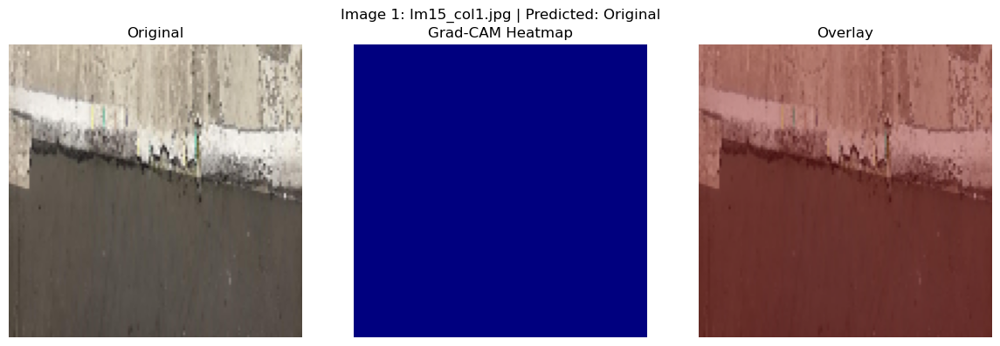

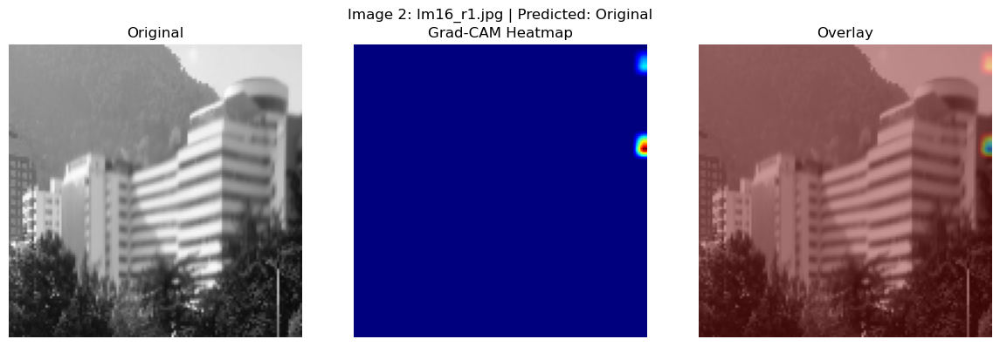

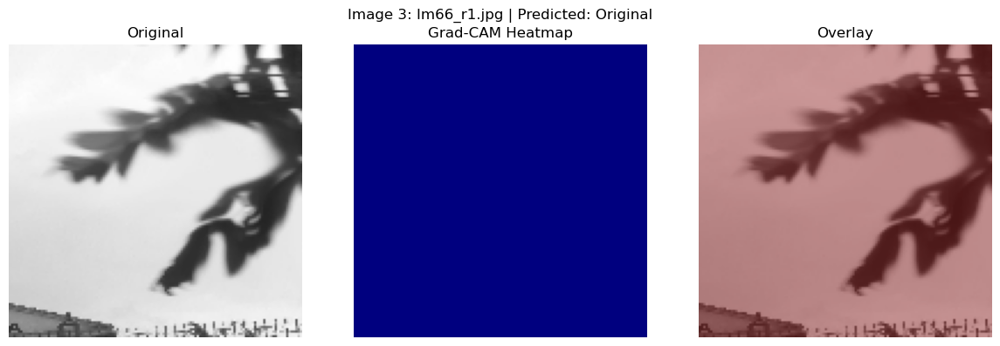

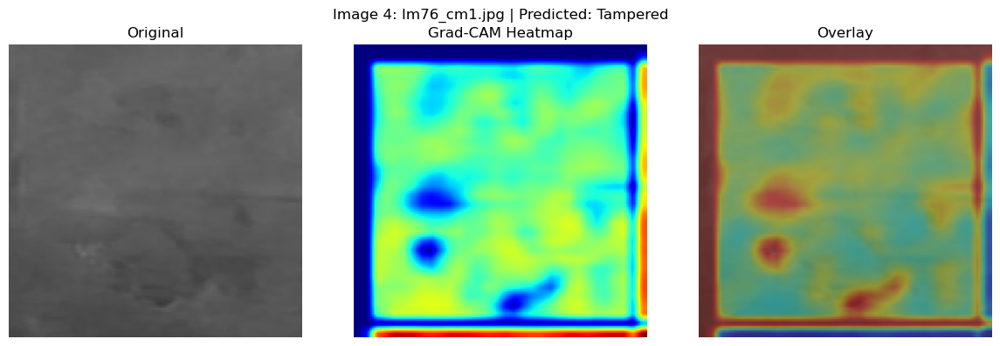

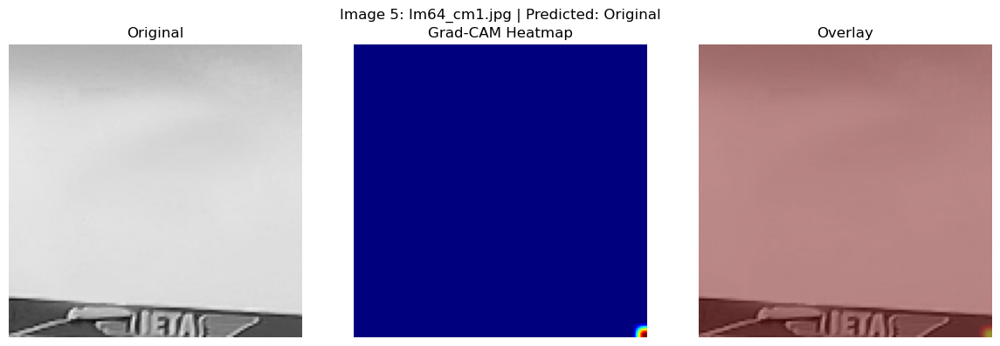

In [11]:
# ------------------------------------------
# Phase 5: Grad-CAM on 5 Selected Tampered Images
# ------------------------------------------

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt

# === 1. Define TamperCNN model ===
class TamperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Flatten(),
            nn.Linear(128 * 16 * 16, 128), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(128, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).squeeze()

# === 2. Load model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TamperCNN()
model.load_state_dict(torch.load("tampered_patch_cnn.pth", map_location=device))
model.to(device).eval()

# === 3. Hook for Grad-CAM ===
activations = None
gradients = None

def save_activation(module, input, output):
    global activations
    activations = output

def save_gradient(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

model.net[6].register_forward_hook(save_activation)
model.net[6].register_full_backward_hook(save_gradient)  # Use full_backward_hook for newer PyTorch

# === 4. List of image paths ===
image_paths = [
    r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED\Im15_col1.jpg",
    r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED\Im16_r1.jpg",
    r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED\Im66_r1.jpg",
    r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED\Im76_cm1.jpg",
    r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED\Im64_cm1.jpg"
]

# === 5. Grad-CAM utility ===
def generate_gradcam(img_path):
    img = cv2.imread(img_path)
    if img is None:
        raise FileNotFoundError(f"Could not load: {img_path}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (128, 128))
    img_np = img / 255.0
    img_tensor = torch.tensor(img_np, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0).to(device)
    img_tensor.requires_grad_()

    # Forward and backward
    output = model(img_tensor)
    pred = output.item()
    model.zero_grad()
    output.backward()

    # Grad-CAM heatmap
    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
    activation_map = activations.squeeze()
    for i in range(activation_map.shape[0]):
        activation_map[i] *= pooled_gradients[i]
    heatmap = torch.mean(activation_map, dim=0).cpu().detach().numpy()
    heatmap = np.maximum(heatmap, 0)
    heatmap = cv2.resize(heatmap, (128, 128))
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    # Overlay
    img_uint8 = (img_np * 255).astype(np.uint8)
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img_uint8, 0.6, heatmap_color, 0.4, 0)

    return img_uint8, heatmap, overlay, pred

# === 6. Visualize results for all 5 images ===
for i, path in enumerate(image_paths):
    original, heatmap, overlay, prediction = generate_gradcam(path)

    plt.figure(figsize=(12, 4))
    plt.suptitle(f"Image {i+1}: {path.split('\\')[-1]} | Predicted: {'Tampered' if prediction > 0.5 else 'Original'}", fontsize=12)

    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


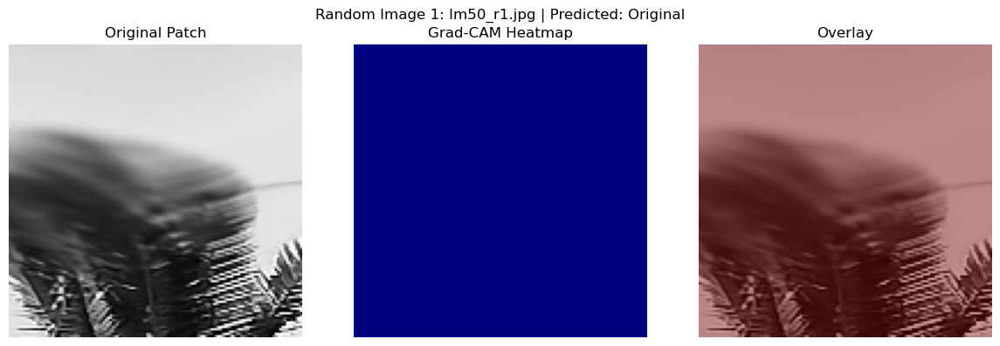

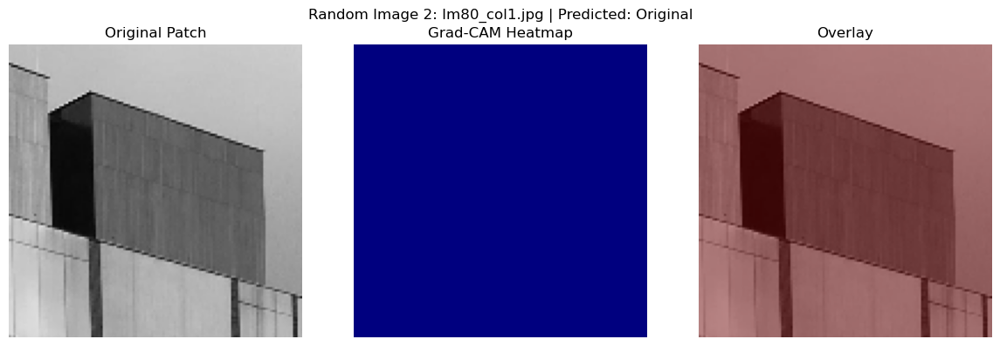

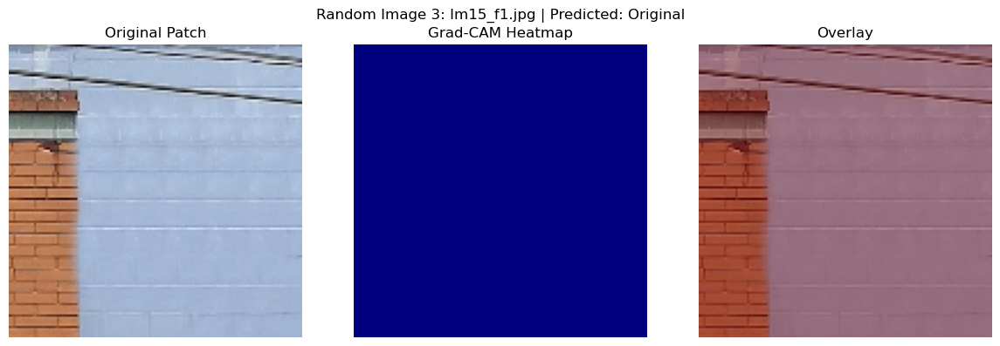

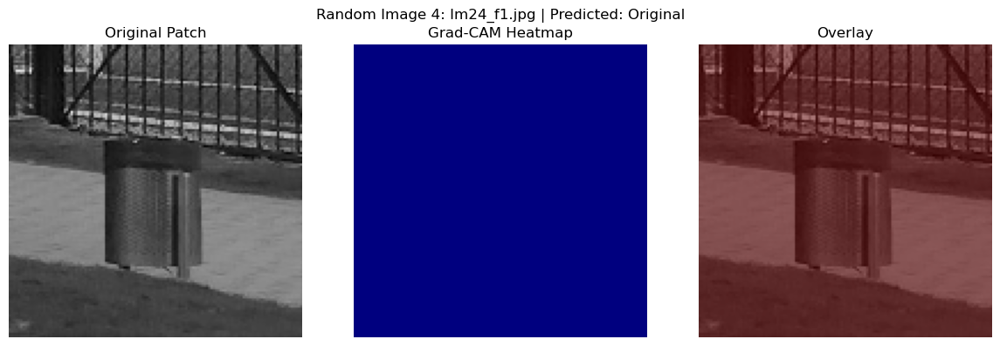

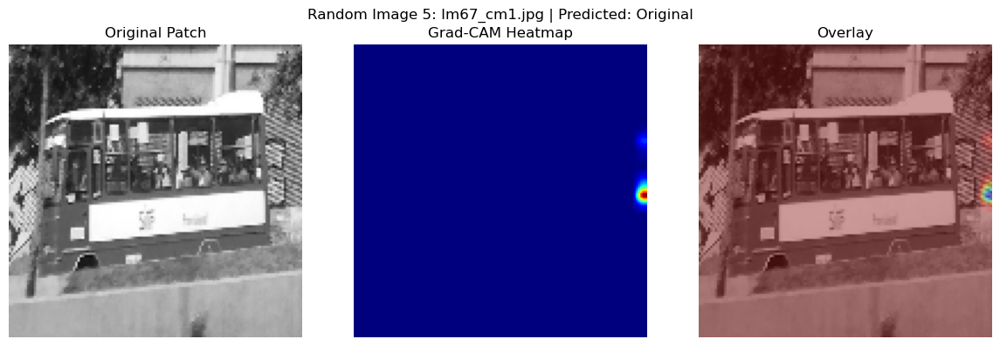

...

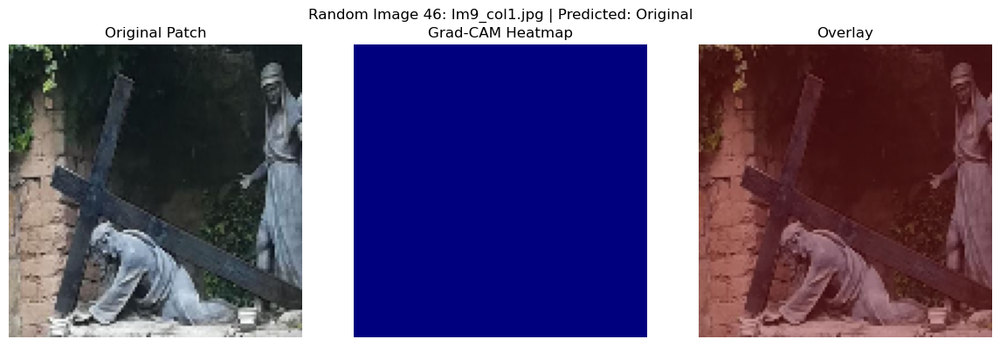

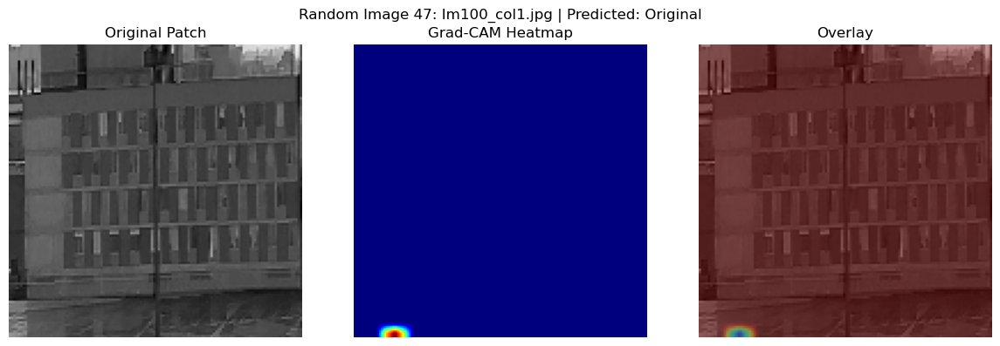

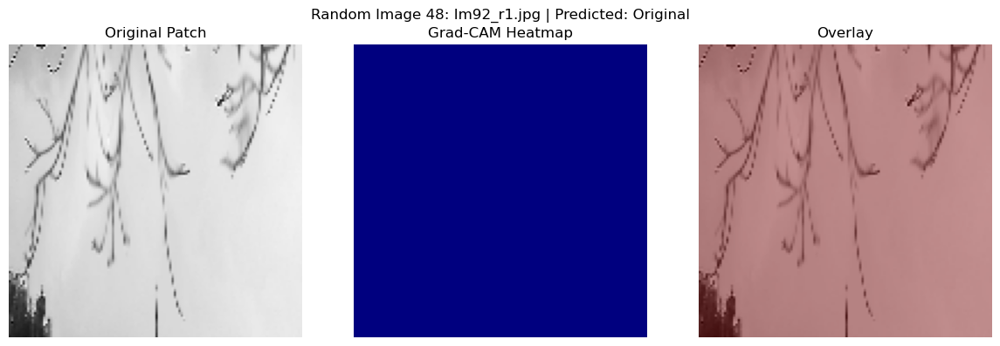

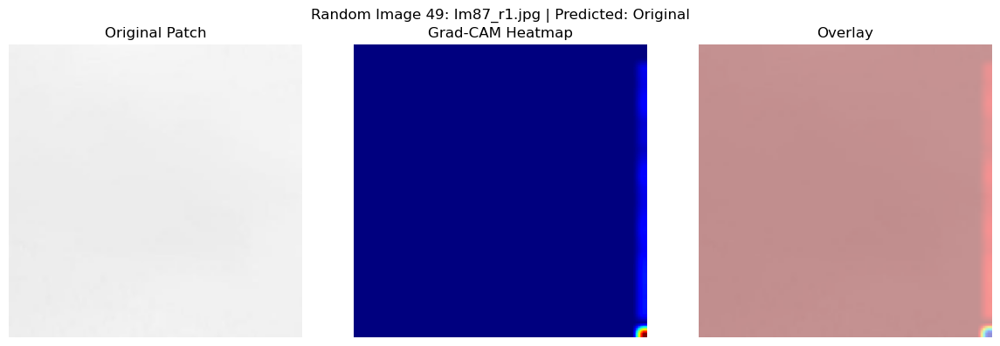

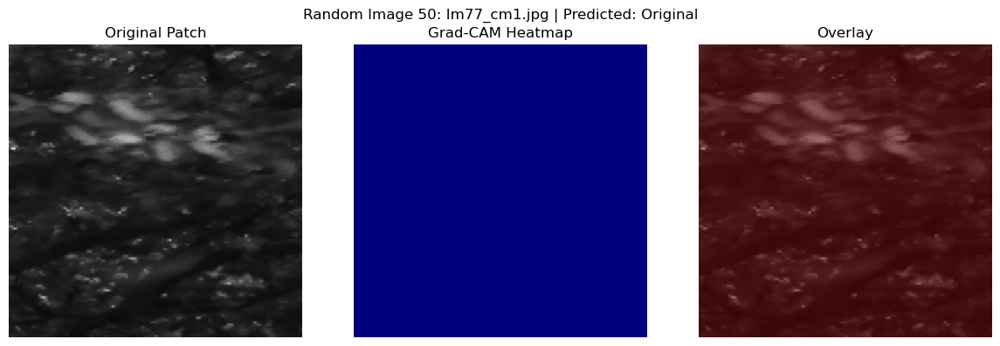

In [15]:
import os
import random
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# === 1. TamperCNN Model ===
class TamperCNN(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Flatten(),
            nn.Linear(128 * 16 * 16, 128), nn.ReLU(), nn.Dropout(0.5),
            nn.Linear(128, 1), nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x).squeeze()

# === 2. Load Model ===
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = TamperCNN()
model.load_state_dict(torch.load("tampered_patch_cnn.pth", map_location=device))
model.to(device).eval()

# === 3. Grad-CAM Hooks ===
activations = None
gradients = None

def save_activation(module, input, output):
    global activations
    activations = output

def save_gradient(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

model.net[6].register_forward_hook(save_activation)
model.net[6].register_full_backward_hook(save_gradient)

# === 4. Folder to pull random images from ===
folder_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED"

# === 5. Get 5 random image paths ===
all_images = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png'))]
random_images = random.sample(all_images, 50)

# === 6. Grad-CAM Utility Function ===
def generate_gradcam(img_path):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (128, 128))
    img_np = img / 255.0
    img_tensor = torch.tensor(img_np, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0).to(device)
    img_tensor.requires_grad_()

    output = model(img_tensor)
    prediction = output.item()
    model.zero_grad()
    output.backward()

    pooled_gradients = torch.mean(gradients, dim=[0, 2, 3])
    activation_map = activations.squeeze()

    for i in range(activation_map.shape[0]):
        activation_map[i] *= pooled_gradients[i]

    heatmap = torch.mean(activation_map, dim=0).cpu().detach().numpy()
    heatmap = np.maximum(heatmap, 0)
    heatmap = cv2.resize(heatmap, (128, 128))
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min() + 1e-8)

    img_uint8 = (img_np * 255).astype(np.uint8)
    heatmap_color = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img_uint8, 0.6, heatmap_color, 0.4, 0)

    return img_uint8, heatmap, overlay, prediction

# === 7. Visualize Random 5 with Grad-CAM ===
for i, path in enumerate(random_images):
    original, heatmap, overlay, pred = generate_gradcam(path)
    fname = os.path.basename(path)

    plt.figure(figsize=(12, 4))
    plt.suptitle(f"Random Image {i+1}: {fname} | Predicted: {'Tampered' if pred > 0.5 else 'Original'}", fontsize=12)

    plt.subplot(1, 3, 1)
    plt.imshow(original)
    plt.title("Original Patch")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(heatmap, cmap='jet')
    plt.title("Grad-CAM Heatmap")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(overlay)
    plt.title("Overlay")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [19]:
# ---------------------------
# STEP 1: Import Dependencies
# ---------------------------

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt

# -----------------------------
# STEP 2: Set Configuration
# -----------------------------

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 32
num_epochs = 10
learning_rate = 0.0001

# -----------------------------
# STEP 3: Define Transforms
# -----------------------------

# ResNet requires 224x224 input size, normalize using ImageNet stats
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# -----------------------------
# STEP 4: Load Datasets
# -----------------------------

# Your folder should look like:
# TRAIN/
#   TAMPERED/
#   ORIGINAL/
# VALIDATION/
#   TAMPERED/
#   ORIGINAL/

train_dir = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\TRAINING_CG-1050\TRAINING"
val_dir = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION"

train_dataset = datasets.ImageFolder(root=train_dir, transform=transform)
val_dataset = datasets.ImageFolder(root=val_dir, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# -----------------------------
# STEP 5: Define Improved Model (ResNet18)
# -----------------------------

class ResNetBinaryClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.base_model = models.resnet18(pretrained=True)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.base_model(x).squeeze()

model = ResNetBinaryClassifier().to(device)

# -----------------------------
# STEP 6: Define Loss and Optimizer
# -----------------------------

criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# -----------------------------
# STEP 7: Train the Model
# -----------------------------

print("🧠 Training Started...")
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.float().to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss/len(train_loader):.4f}")

# -----------------------------
# STEP 8: Evaluate the Model
# -----------------------------

print("\n📊 Evaluation on Validation Set")
model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        preds = (outputs > 0.5).long()

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

print(classification_report(all_labels, all_preds, target_names=["Original", "Tampered"]))

# -----------------------------
# STEP 9: Save the Improved Model
# -----------------------------

torch.save(model.state_dict(), "resnet_tampered_patch_classifier.pth")
print("\n✅ Model saved as 'resnet_tampered_patch_classifier.pth'")


C:\Users\imran\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\imran\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\imran/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:06<00:00, 7.46MB/s]


🧠 Training Started...
Epoch [1/10], Loss: 0.6859
Epoch [2/10], Loss: 0.5674
Epoch [3/10], Loss: 0.5112
Epoch [4/10], Loss: 0.4088
Epoch [5/10], Loss: 0.3331
Epoch [6/10], Loss: 0.2549
Epoch [7/10], Loss: 0.1902
Epoch [8/10], Loss: 0.1635
Epoch [9/10], Loss: 0.1598
Epoch [10/10], Loss: 0.1071

📊 Evaluation on Validation Set
              precision    recall  f1-score   support

    Original       0.74      0.74      0.74       314
    Tampered       0.74      0.74      0.74       314

    accuracy                           0.74       628
   macro avg       0.74      0.74      0.74       628
weighted avg       0.74      0.74      0.74       628


✅ Model saved as 'resnet_tampered_patch_classifier.pth'


C:\Users\imran\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\imran\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\imran\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


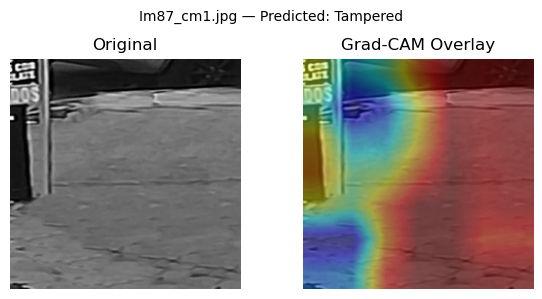

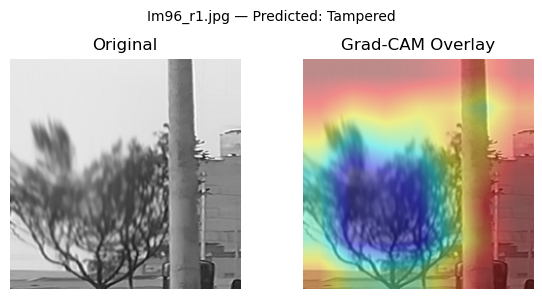

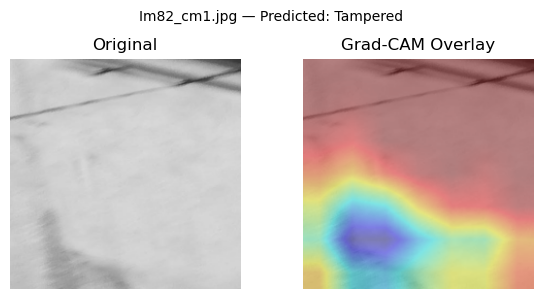

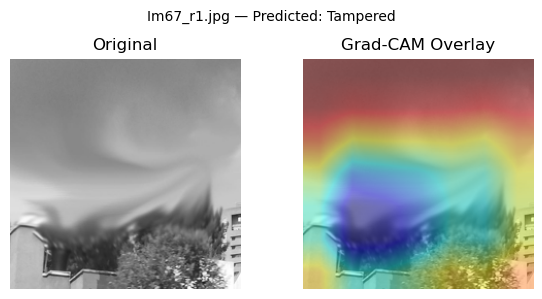

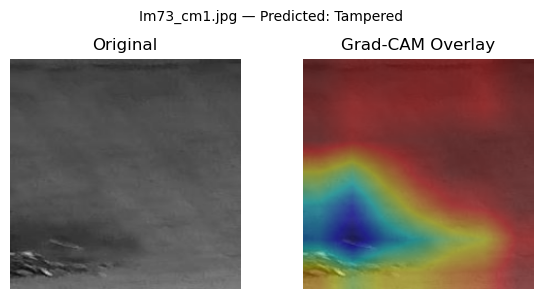

...

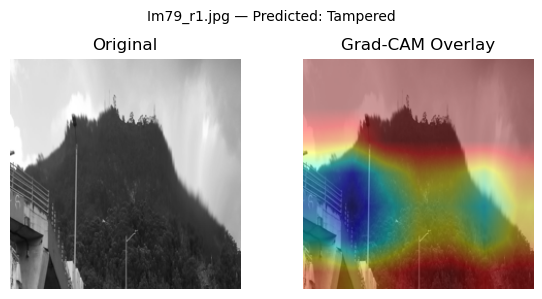

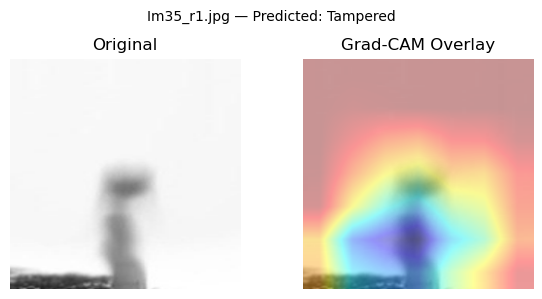

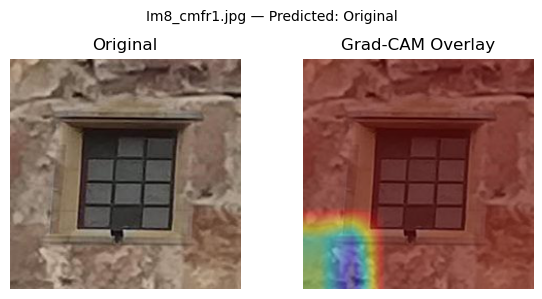

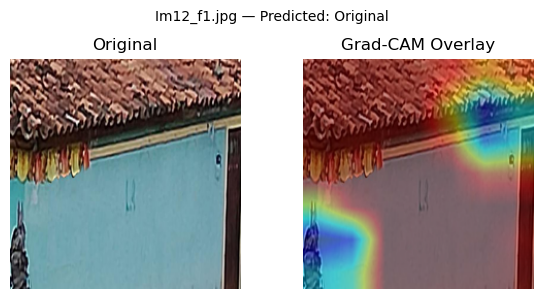

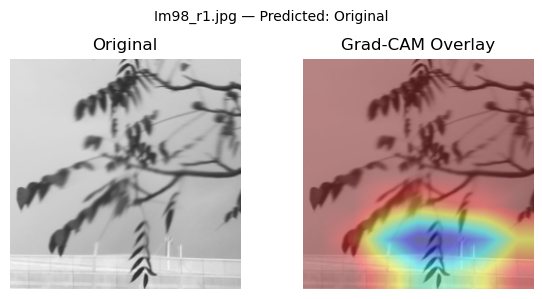

In [20]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import random

# ----------------------------
# RESNET18 BINARY CLASSIFIER
# ----------------------------
class ResNetBinaryClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.base_model = models.resnet18(pretrained=False)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.base_model(x).squeeze()

# ----------------------------
# LOAD MODEL
# ----------------------------
model = ResNetBinaryClassifier()
model.load_state_dict(torch.load("resnet_tampered_patch_classifier.pth", map_location=torch.device('cpu')))
model.eval()

# ----------------------------
# REGISTER HOOKS FOR GRAD-CAM
# ----------------------------
gradients = []
activations = []

def save_gradient_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

def save_activation_hook(module, input, output):
    activations.append(output)

final_conv_layer = model.base_model.layer4
final_conv_layer.register_forward_hook(save_activation_hook)
final_conv_layer.register_backward_hook(save_gradient_hook)

# ----------------------------
# TRANSFORM
# ----------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])

# ----------------------------
# GRAD-CAM FUNCTION
# ----------------------------
def generate_grad_cam(image_path):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)

    gradients.clear()
    activations.clear()

    output = model(input_tensor)
    prediction = (output.item() > 0.5)

    model.zero_grad()
    output.backward()

    grad = gradients[0][0].detach().numpy()
    act = activations[0][0].detach().numpy()

    weights = np.mean(grad, axis=(1, 2))
    cam = np.zeros(act.shape[1:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * act[i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    img_np = np.array(image.resize((224, 224)))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = heatmap * 0.4 + img_np * 0.6
    overlay = np.uint8(overlay)

    return img_np, overlay, prediction

# ----------------------------
# SELECT 20 RANDOM IMAGES
# ----------------------------
folder_path = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED"
image_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png'))]
random_images = random.sample(image_files, 20)

# ----------------------------
# DISPLAY RESULTS
# ----------------------------
for idx, path in enumerate(random_images):
    original, overlay, pred = generate_grad_cam(path)

    plt.figure(figsize=(6, 3))
    plt.suptitle(f"{os.path.basename(path)} — Predicted: {'Tampered' if pred else 'Original'}", fontsize=10)

    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(original)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Grad-CAM Overlay")
    plt.imshow(overlay)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


C:\Users\imran\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


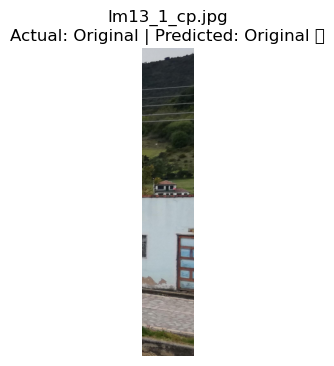

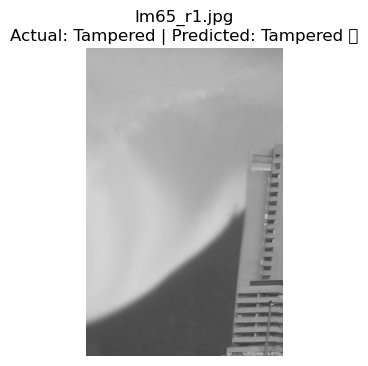

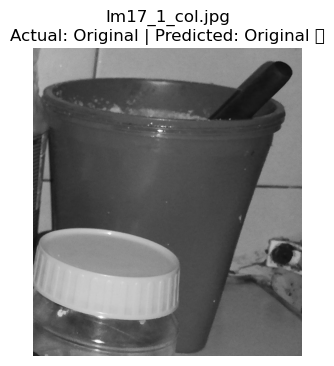

C:\Users\imran\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


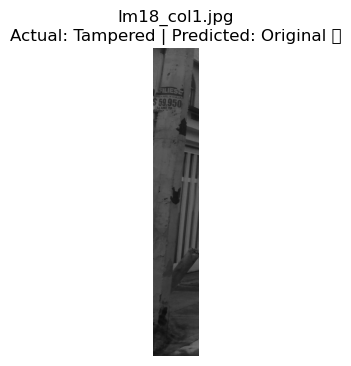

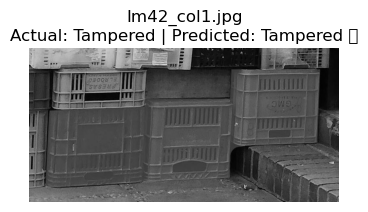

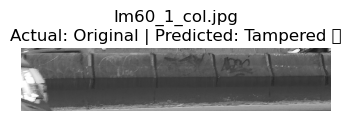

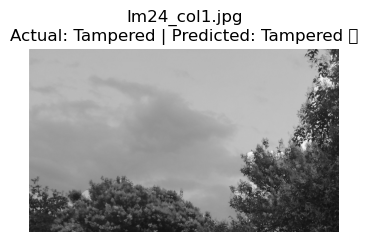

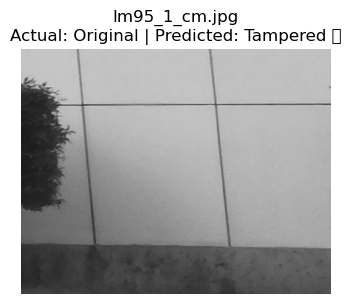

...

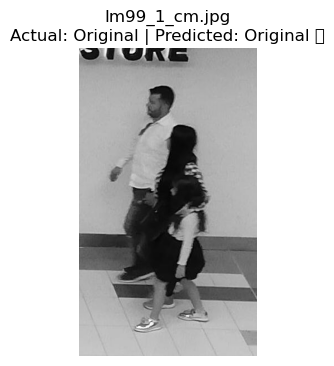

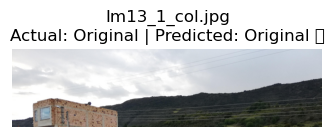

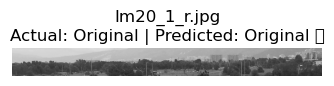

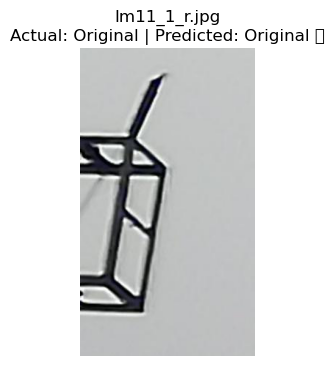

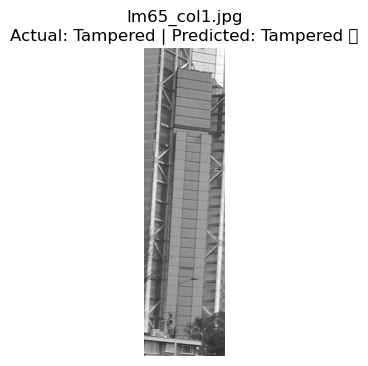

In [21]:
import torch
import torch.nn as nn
from torchvision import models, transforms
from PIL import Image
import os
import random
import matplotlib.pyplot as plt

# ----------------------------
# MODEL CLASS (ResNet18 Binary)
# ----------------------------
class ResNetBinaryClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.base_model = models.resnet18(pretrained=False)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.base_model(x).squeeze()

# ----------------------------
# LOAD TRAINED MODEL
# ----------------------------
model = ResNetBinaryClassifier()
model.load_state_dict(torch.load("resnet_tampered_patch_classifier.pth", map_location=torch.device('cpu')))
model.eval()

# ----------------------------
# IMAGE TRANSFORM
# ----------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])

# ----------------------------
# SET FOLDER PATHS
# ----------------------------
original_dir = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\ORIGINAL"
tampered_dir = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION\TAMPERED"

original_images = [os.path.join(original_dir, f) for f in os.listdir(original_dir) if f.endswith(('.jpg', '.png'))]
tampered_images = [os.path.join(tampered_dir, f) for f in os.listdir(tampered_dir) if f.endswith(('.jpg', '.png'))]

sampled_original = random.sample(original_images, 10)
sampled_tampered = random.sample(tampered_images, 10)

test_images = [(img, 0) for img in sampled_original] + [(img, 1) for img in sampled_tampered]
random.shuffle(test_images)

# ----------------------------
# PREDICT AND DISPLAY RESULTS
# ----------------------------
for path, actual_label in test_images:
    image = Image.open(path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)
    output = model(input_tensor)
    pred_label = int(output.item() > 0.5)

    correct = "✅" if pred_label == actual_label else "❌"

    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.title(f"{os.path.basename(path)}\nActual: {'Tampered' if actual_label else 'Original'} | Predicted: {'Tampered' if pred_label else 'Original'} {correct}")
    plt.axis('off')
    plt.show()


<Figure size 600x500 with 0 Axes>

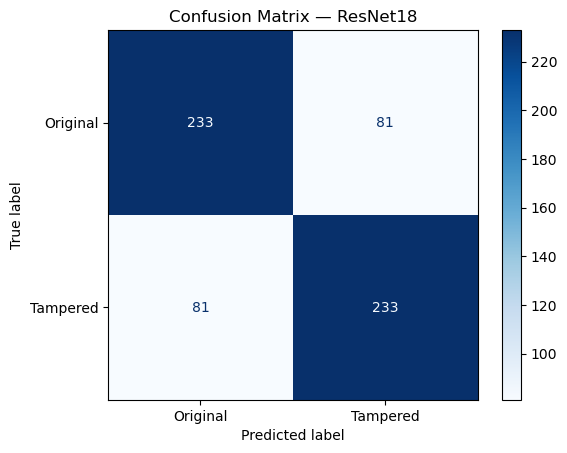


📊 Classification Report:

              precision    recall  f1-score   support

    Original       0.74      0.74      0.74       314
    Tampered       0.74      0.74      0.74       314

    accuracy                           0.74       628
   macro avg       0.74      0.74      0.74       628
weighted avg       0.74      0.74      0.74       628



In [22]:
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# ----------------------------
# Define the model again
# ----------------------------
class ResNetBinaryClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.base_model = models.resnet18(pretrained=False)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.base_model(x).squeeze()

# ----------------------------
# Load trained model
# ----------------------------
model = ResNetBinaryClassifier()
model.load_state_dict(torch.load("resnet_tampered_patch_classifier.pth", map_location=torch.device('cpu')))
model.eval()

# ----------------------------
# Load validation dataset
# ----------------------------
val_dir = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION"
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406], 
        std=[0.229, 0.224, 0.225]
    )
])
val_dataset = datasets.ImageFolder(root=val_dir, transform=val_transform)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# ----------------------------
# Generate predictions
# ----------------------------
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        outputs = model(images)
        preds = (outputs > 0.5).int()
        all_preds.extend(preds.tolist())
        all_labels.extend(labels.tolist())

# ----------------------------
# Confusion Matrix & Report
# ----------------------------
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Original", "Tampered"])

plt.figure(figsize=(6, 5))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix — ResNet18")
plt.show()

# Optional: Print classification report
print("\n📊 Classification Report:\n")
print(classification_report(all_labels, all_preds, target_names=["Original", "Tampered"]))


C:\Users\imran\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\imran\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
C:\Users\imran\anaconda3\Lib\site-packages\torch\nn\modules\module.py:1842: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)
C:\Users\imran\AppData\Local\Temp\ipykernel_16828\3835671275.py:117: UserWarning

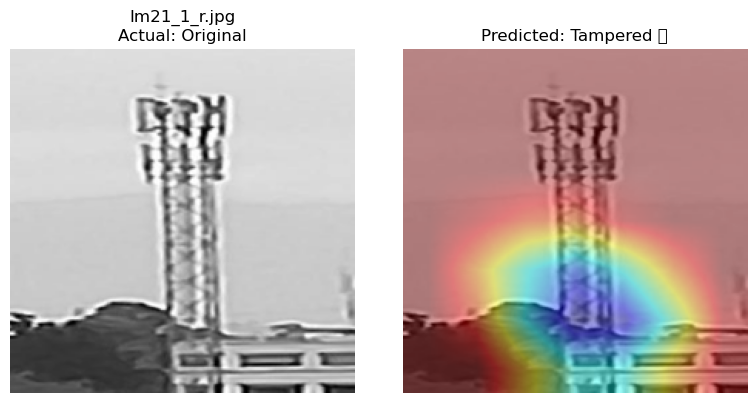

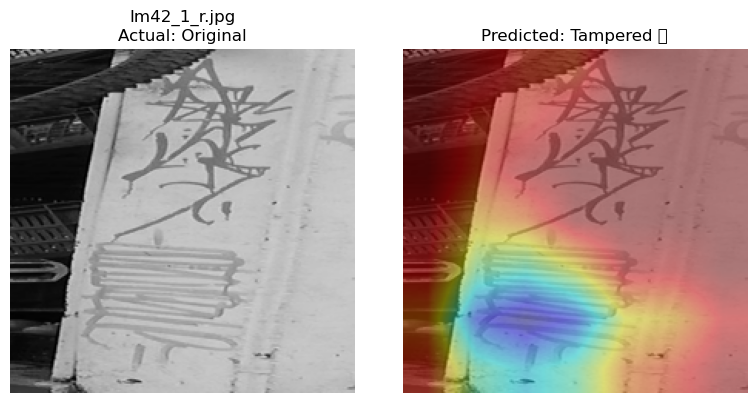

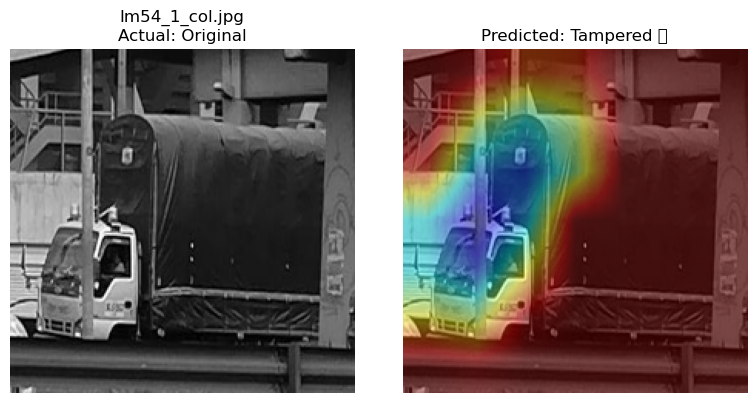

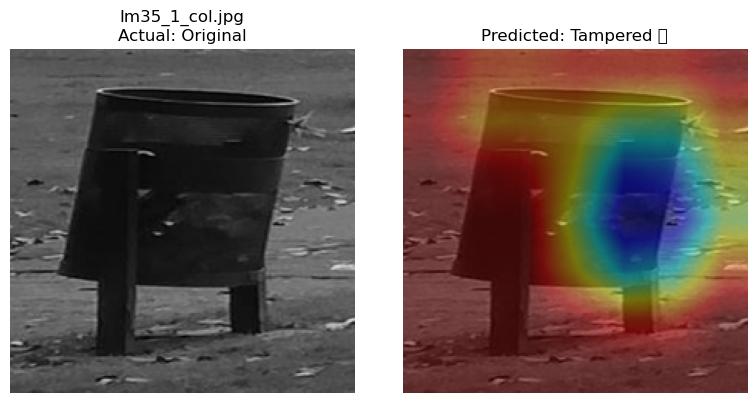

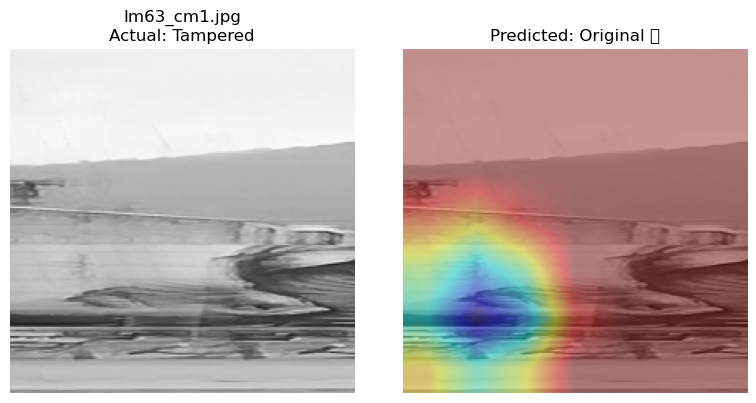

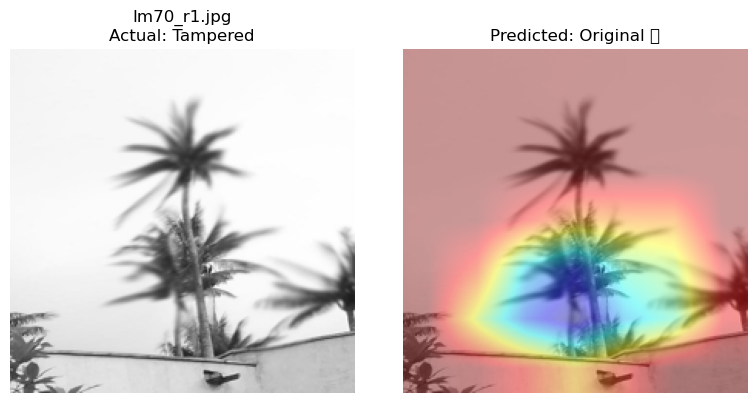

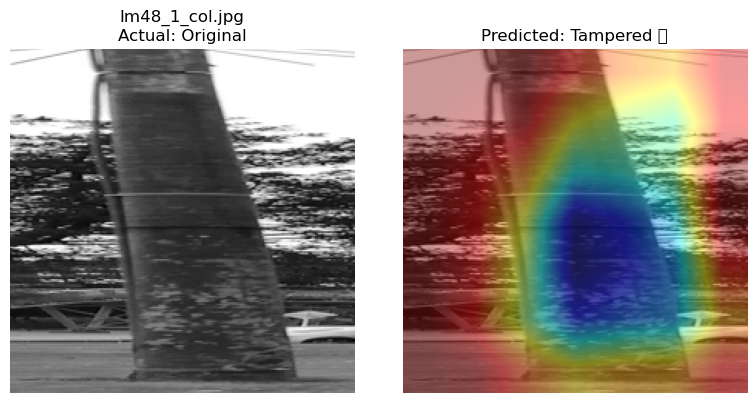

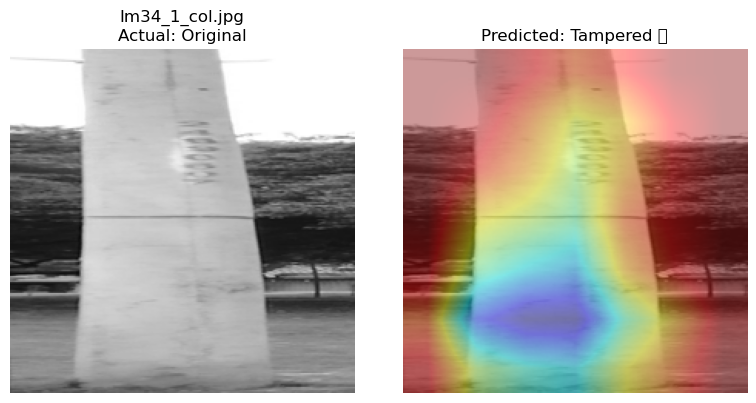

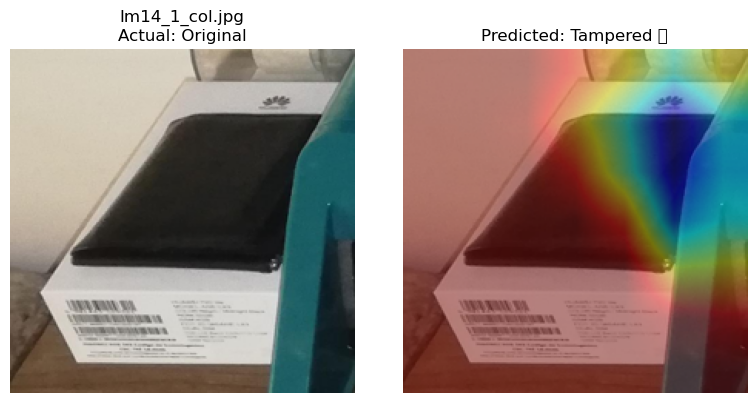

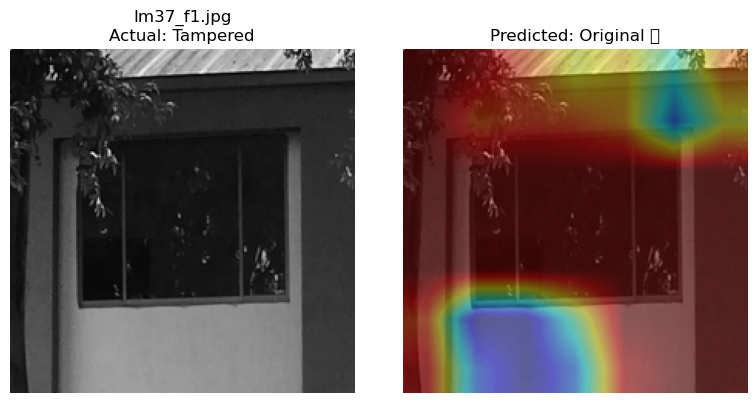

In [23]:
import os
import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import random

# --- Define the Model ---
class ResNetBinaryClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.base_model = models.resnet18(pretrained=False)
        num_ftrs = self.base_model.fc.in_features
        self.base_model.fc = nn.Sequential(
            nn.Linear(num_ftrs, 128),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.base_model(x).squeeze()

model = ResNetBinaryClassifier()
model.load_state_dict(torch.load("resnet_tampered_patch_classifier.pth", map_location='cpu'))
model.eval()

# --- Register Grad-CAM Hooks ---
gradients = []
activations = []

def save_grad_hook(module, grad_input, grad_output):
    gradients.append(grad_output[0])

def save_act_hook(module, input, output):
    activations.append(output)

model.base_model.layer4.register_forward_hook(save_act_hook)
model.base_model.layer4.register_backward_hook(save_grad_hook)

# --- Image Transforms ---
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# --- Load Validation Dataset ---
val_dir = r"C:\Users\imran\OneDrive\Robotics Projects\Image Forgery\Image Data\VALIDATION_CG-1050\VALIDATION"
dataset = datasets.ImageFolder(root=val_dir, transform=transform)
loader = DataLoader(dataset, batch_size=1, shuffle=False)

# --- Identify Misclassified Images ---
misclassified = []

with torch.no_grad():
    for idx, (img, label) in enumerate(loader):
        output = model(img)
        pred = int(output.item() > 0.5)
        true = int(label.item())
        if pred != true:
            path = dataset.samples[idx][0]
            misclassified.append((path, true, pred))

# --- Grad-CAM Function ---
def gradcam(image_path):
    img = Image.open(image_path).convert("RGB")
    input_tensor = transform(img).unsqueeze(0)

    gradients.clear()
    activations.clear()

    output = model(input_tensor)
    model.zero_grad()
    output.backward()

    grad = gradients[0][0].detach().numpy()
    act = activations[0][0].detach().numpy()

    weights = np.mean(grad, axis=(1, 2))
    cam = np.zeros(act.shape[1:], dtype=np.float32)
    for i, w in enumerate(weights):
        cam += w * act[i]

    cam = np.maximum(cam, 0)
    cam = (cam - cam.min()) / (cam.max() + 1e-8)
    cam = cv2.resize(cam, (224, 224))

    img_np = np.array(img.resize((224, 224)))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(img_np, 0.6, heatmap, 0.4, 0)

    return img_np, overlay

# --- Visualize 10 Misclassified Images ---
for path, actual, pred in random.sample(misclassified, 10):
    original, cam_overlay = gradcam(path)
    fname = os.path.basename(path)

    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.axis("off")
    plt.title(f"{fname}\nActual: {'Tampered' if actual else 'Original'}")

    plt.subplot(1, 2, 2)
    plt.imshow(cam_overlay)
    plt.axis("off")
    plt.title(f"Predicted: {'Tampered' if pred else 'Original'} ❌")

    plt.tight_layout()
    plt.show()
